# The Battle of the Neighborhoods - Week 2

**Data :**


_We will be using the below datasets:_

_Data 1_ : Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood.

[This dataset exists for free on the web. Link to the dataset is :](https://geo.nyu.edu/catalog/nyu_2451_34572)

_Data 2_: [Second data which will be used is the DOHMH Farmers Markets and Food Boxes dataset]

(https://data.cityofnewyork.us/dataset/DOHMH-Farmers-Markets-and-Food-Boxes/8vwk-6iz2)

[Website](https://www.grownyc.org/greenmarketco/foodbox) 

_Data 3_ : [Data from wikipedia as given below :] 

(https://en.wikipedia.org/wiki/New_York_City)
(https://en.wikipedia.org/wiki/Economy_of_New_York_City) 
(https://en.wikipedia.org/wiki/Portal:New_York_City) 
(https://en.wikipedia.org/wiki/Cuisine_of_New_York_City)
(https://en.wikipedia.org/wiki/List_of_Michelin_starred_restaurants_in_New_York_City)

_Data 4_ : Newyork city geographical coordinates data will be utilized as input for the Foursquare API, that will be leveraged to provision venues information for each neighborhood.We will use the Foursquare API to explore neighborhoods in New York City.

# New York city geographical coordinates dataset

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import csv # implements classes to read and write tabular data in CSV form

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/DSX-Python35

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    openssl-1.0.2r             |       h14c3975_0         3.1 MB  conda-forge
    certifi-2018.8.24          |        py35_1001         139 KB  conda-forge
    ca-certificates-2019.6.16  |       hecc5488_0         145 KB  conda-forge
    geopy-1.20.0               |             py_0          57 KB  conda-forge
    geographiclib-1.49         |             py_0          32 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         3.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.49-py_0         conda-forge
    geopy:           1.20.0-py_0       conda-forge

The following packages will be UPDATED:

   

In [3]:
!wget -q -O 'newyork_data.json' https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json
print('Data downloaded!')

Data downloaded!


**Data exploratoin**

In [4]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)
neighborhoods_data = newyork_data['features']

In [4]:
neighborhoods_data[0]

{'geometry': {'coordinates': [-73.84720052054902, 40.89470517661],
  'type': 'Point'},
 'geometry_name': 'geom',
 'id': 'nyu_2451_34572.1',
 'properties': {'annoangle': 0.0,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661],
  'borough': 'Bronx',
  'name': 'Wakefield',
  'stacked': 1},
 'type': 'Feature'}

**Data Transformation**

In [5]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)
neighborhoods

,Borough,Neighborhood,Latitude,Longitude


In [6]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [7]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [8]:
neighborhoods.to_csv('BON1_NYC_GEO.csv',index=False)

**Get the latitude and longitude values of New York City.**

In [9]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


**Create a map**

In [10]:
map_NewYork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_NewYork)  
    
map_NewYork

# Web scrapping of Population and Demographics data of New York city from Wikipedia

**Population**

In [11]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# conda install -c anaconda beautiful-soup --yes
from bs4 import BeautifulSoup # package for parsing HTML and XML documents

import csv # implements classes to read and write tabular data in CSV form

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Libraries imported.


**Web scrapping of Population data from wikipedia website**

In [12]:
website_url = requests.get('https://en.wikipedia.org/wiki/Demographics_of_New_York_City').text
soup = BeautifulSoup(website_url,'lxml')
table = soup.find('table',{'class':'wikitable sortable'})
#print(soup.prettify())

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('POPULATION1.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

In [13]:
Pop_data=pd.read_csv('POPULATION1.csv')
Pop_data.drop(Pop_data.columns[[7,8,9,10,11]], axis=1,inplace=True)
print('Data downloaded!')

Data downloaded!


**Data cleaning**

In [14]:
Pop_data.columns = Pop_data.columns.str.replace(' ', '')
Pop_data.columns = Pop_data.columns.str.replace('\'','')
Pop_data.rename(columns={'Borough':'persons_sq_mi','County':'persons_sq_km'}, inplace=True)
Pop_data

,NewYorkCitysfiveboroughsvte,Jurisdiction,Population,GrossDomesticProduct,Landarea,Density,persons_sq_mi,squarekm,persons/sq.mi,persons/sq.km
0,The Bronx\n,\n Bronx\n,"1,471,160\n",28.787\n,"19,570\n",42.10\n,109.04\n,NaN,NaN,NaN
1,Brooklyn\n,\n Kings\n,"2,648,771\n",63.303\n,"23,900\n",70.82\n,183.42\n,NaN,NaN,NaN
2,Manhattan\n,\n New York\n,"1,664,727\n",629.682\n,"378,250\n",22.83\n,59.13\n,NaN,NaN,NaN
3,Queens\n,\n Queens\n,"2,358,582\n",73.842\n,"31,310\n",108.53\n,281.09\n,NaN,NaN,NaN
4,Staten Island\n,\n Richmond\n,"479,458\n",11.249\n,"23,460\n",58.37\n,151.18\n,NaN,NaN,NaN
5,City of New York,"8,622,698",806.863,"93,574",302.64,783.83,"28,188",NaN,NaN,NaN
6,State of New York,"19,849,399","1,547.116","78,354","47,214","122,284",416.4,NaN,NaN,NaN
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
Pop_data.rename(columns = {'NewYorkCitysfiveboroughsvte\n' : 'Borough',
                   'Jurisdiction\n':'County',
                   'Population\n':'Estimate_2017', 
                   'Landarea\n':'square_miles',
                    'Density\n':'square_km'}, inplace=True)
Pop_data

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,squarekm,persons/sq.mi,persons/sq.km
0,The Bronx\n,\n Bronx\n,"1,471,160\n",28.787\n,"19,570\n",42.10\n,109.04\n,NaN,NaN,NaN
1,Brooklyn\n,\n Kings\n,"2,648,771\n",63.303\n,"23,900\n",70.82\n,183.42\n,NaN,NaN,NaN
2,Manhattan\n,\n New York\n,"1,664,727\n",629.682\n,"378,250\n",22.83\n,59.13\n,NaN,NaN,NaN
3,Queens\n,\n Queens\n,"2,358,582\n",73.842\n,"31,310\n",108.53\n,281.09\n,NaN,NaN,NaN
4,Staten Island\n,\n Richmond\n,"479,458\n",11.249\n,"23,460\n",58.37\n,151.18\n,NaN,NaN,NaN
5,City of New York,"8,622,698",806.863,"93,574",302.64,783.83,"28,188",NaN,NaN,NaN
6,State of New York,"19,849,399","1,547.116","78,354","47,214","122,284",416.4,NaN,NaN,NaN
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
Pop_data = Pop_data.fillna('')
Pop_data

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,squarekm,persons/sq.mi,persons/sq.km
0,The Bronx\n,\n Bronx\n,"1,471,160\n",28.787\n,"19,570\n",42.10\n,109.04\n,,,
1,Brooklyn\n,\n Kings\n,"2,648,771\n",63.303\n,"23,900\n",70.82\n,183.42\n,,,
2,Manhattan\n,\n New York\n,"1,664,727\n",629.682\n,"378,250\n",22.83\n,59.13\n,,,
3,Queens\n,\n Queens\n,"2,358,582\n",73.842\n,"31,310\n",108.53\n,281.09\n,,,
4,Staten Island\n,\n Richmond\n,"479,458\n",11.249\n,"23,460\n",58.37\n,151.18\n,,,
5,City of New York,"8,622,698",806.863,"93,574",302.64,783.83,"28,188",,,
6,State of New York,"19,849,399","1,547.116","78,354","47,214","122,284",416.4,,,
7,Sources:[14] and see individual borough articl...,,,,,,,,,


In [17]:
i = Pop_data[((Pop_data.County == 'Sources: [2] and see individual borough articles'))].index
Pop_data.drop(i)

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,squarekm,persons/sq.mi,persons/sq.km
0,The Bronx\n,\n Bronx\n,"1,471,160\n",28.787\n,"19,570\n",42.10\n,109.04\n,,,
1,Brooklyn\n,\n Kings\n,"2,648,771\n",63.303\n,"23,900\n",70.82\n,183.42\n,,,
2,Manhattan\n,\n New York\n,"1,664,727\n",629.682\n,"378,250\n",22.83\n,59.13\n,,,
3,Queens\n,\n Queens\n,"2,358,582\n",73.842\n,"31,310\n",108.53\n,281.09\n,,,
4,Staten Island\n,\n Richmond\n,"479,458\n",11.249\n,"23,460\n",58.37\n,151.18\n,,,
5,City of New York,"8,622,698",806.863,"93,574",302.64,783.83,"28,188",,,
6,State of New York,"19,849,399","1,547.116","78,354","47,214","122,284",416.4,,,
7,Sources:[14] and see individual borough articl...,,,,,,,,,


In [18]:
Pop_data.to_csv('POPULATION.csv',index=False)

**DEMOGRAPHICS**

_Web scrapping of Demographics data from wikipedia_

In [19]:
website_url = requests.get('https://en.wikipedia.org/wiki/New_York_City').text
soup = BeautifulSoup(website_url,'lxml')
table = soup.find('table',{'class':'wikitable sortable collapsible'})
#print(soup.prettify())

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('DEMO.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

In [20]:
Demo_data=pd.read_csv('DEMO.csv')
print('Data downloaded!')


Data downloaded!


In [21]:
Demo_data

,Racial composition,2010[249],1990[251],1970[251],1940[251]
0,White,44.0%,52.3%,76.6%,93.6%\n
1,—Non-Hispanic,33.3%,43.2%,62.9%[252],92.0%\n
2,Black or African American,25.5%,28.7%,21.1%,6.1%\n
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%[252],1.6%\n
4,Asian,12.7%,7.0%,1.2%,−\n


_Data cleaning_

In [22]:
Demo_data.columns

Index(['Racial composition', '2010[249]', '1990[251]', '1970[251]',
       '1940[251]\n'],
      dtype='object')

In [23]:
Demo_data.rename(columns = {'2010[237]' : '2010',
                   '1990[239]':'1990',
                   '1970[239]':'1970', 
                   '1940[239]\n':'1940',
                    }, inplace=True)
Demo_data

,Racial composition,2010[249],1990[251],1970[251],1940[251]
0,White,44.0%,52.3%,76.6%,93.6%\n
1,—Non-Hispanic,33.3%,43.2%,62.9%[252],92.0%\n
2,Black or African American,25.5%,28.7%,21.1%,6.1%\n
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%[252],1.6%\n
4,Asian,12.7%,7.0%,1.2%,−\n


In [24]:
Demo_data.columns

Index(['Racial composition', '2010[249]', '1990[251]', '1970[251]',
       '1940[251]\n'],
      dtype='object')

In [25]:
Demo_data.columns = Demo_data.columns.str.replace(' ', '')

In [26]:
Demo_data= Demo_data.replace('\n',' ', regex=True)
Demo_data

,Racialcomposition,2010[249],1990[251],1970[251],1940[251]
0,White,44.0%,52.3%,76.6%,93.6%
1,—Non-Hispanic,33.3%,43.2%,62.9%[252],92.0%
2,Black or African American,25.5%,28.7%,21.1%,6.1%
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%[252],1.6%
4,Asian,12.7%,7.0%,1.2%,−


In [90]:
Demo_data.to_csv('DEMOGRAPHICS.csv',index=False)

# Farmers market data

In [30]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker

# notice: installing seaborn might takes a few minutes
!conda install -c anaconda seaborn -y
import seaborn as sns

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/DSX-Python35

  added / updated specs: 
    - seaborn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2018.8.24          |           py35_1         139 KB  anaconda
    openssl-1.0.2s             |       h7b6447c_0         3.1 MB  anaconda
    seaborn-0.9.0              |           py35_0         378 KB  anaconda
    ca-certificates-2019.5.15  |                0         133 KB  anaconda
    ------------------------------------------------------------
                                           Total:         3.8 MB

The following packages will be UPDATED:

    openssl:         1.0.2r-h14c3975_0    conda-forge --> 1.0.2s-h7b6447c_0 anaconda
    seaborn:         0.8.0-py35h15a2772_0             --> 0.9.0-py35_0      anaconda

In [49]:
# Data from website - https://data.cityofnewyork.us/dataset/DOHMH-Farmers-Markets-and-Food-Boxes/8vwk-6iz2
body = client_697c296344734375af43f9b31ad91125.get_object(Bucket='capstone-donotdelete-pr-w81lc2lnw2glhn',Key='dohmh-farmers-markets-and-food-boxes-1.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

FM_NYC = pd.read_csv(body)
FM_NYC.head()


,FacilityName,Service Category,Service Type,Address,Address 2,Borough,ZipCode,Latitude,Longitude,AdditionalInfo,StartDate,EndDate,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Accepts EBT,NYC Dept of Health Cooking Demonstrations,Open Year-Round,Website,Location Point
0,Inwood Park Greenmarket,Farmers Markets and Food Boxes,Farmers Markets,Isham St bet Seaman & Cooper,NaN,Manhattan,10034,40.869009,-73.920320,Open year-round,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8am-3pm,NaN,True,False,True,https://www.grownyc.org/greenmarket,"(40.8690087167, -73.9203204394)"
1,82nd Street Greenmarket,Farmers Markets and Food Boxes,Farmers Markets,82nd St bet 1st & York Aves,NaN,Manhattan,10028,40.773448,-73.948954,Open year-round,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9am-2:30pm,NaN,True,False,True,https://www.grownyc.org/greenmarket,"(40.7734483572999, -73.9489535725)"
2,1 Centre Street,Farmers Markets and Food Boxes,Food Boxes,1 Centre Street,"South Building, 9th Floor",Manhattan,11101,40.713028,-74.003753,Open year-round,NaN,NaN,NaN,NaN,NaN,2:00 pm - 6:00 pm,NaN,NaN,NaN,True,False,True,https://www.grownyc.org/greenmarketco/foodbox,"(40.7130276, -74.0037529)"
3,125th Street Farmers Market,Farmers Markets and Food Boxes,Farmers Markets,125th St & Adam Clayton Powell Jr Blvd,NaN,Manhattan,10027,40.808981,-73.948327,Market open dates: 6/13/2017 to 11/21/2017,06/13/2017,11/21/2017,NaN,10am-7pm,NaN,NaN,NaN,NaN,NaN,True,False,False,https://www.grownyc.org/greenmarket,"(40.8089813746999, -73.9483266703999)"
4,170 Farm Stand,Farmers Markets and Food Boxes,Farmers Markets,170th St & Townsend Ave,NaN,Bronx,10452,40.840095,-73.916827,Market open dates: 7/5/2017 to 11/22/2017,07/05/2017,11/22/2017,NaN,NaN,2:30pm-6:30pm,NaN,NaN,NaN,NaN,True,False,False,NaN,"(40.840095, -73.916827)"


In [50]:
FM_NYC.rename(columns={'Service Type':'Service_Type'}, inplace=True)
print(FM_NYC.Service_Type.unique())

['Farmers Markets' 'Food Boxes']


In [51]:
FM_NYC['Service_Type'].value_counts().to_frame()

,Service_Type
Farmers Markets,144
Food Boxes,17


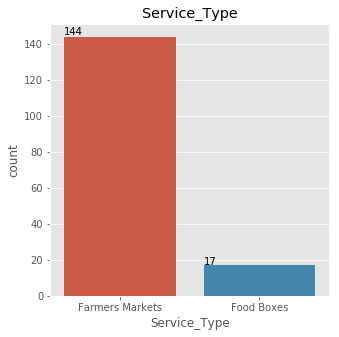

In [52]:
fig,ax = plt.subplots(1, 1, figsize=(5, 5))
sns.countplot(x='Service_Type',data=FM_NYC)
ax.set_title("Service_Type")
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate('', (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))
    
plt.show();


In [53]:
# FM_NYC_filtered - Dataset with only Farmers Market
FM_NYC_filtered = FM_NYC[FM_NYC['Service_Type'] == 'Farmers Markets'].copy()
FM_NYC_filtered ['Borough'] = FM_NYC_filtered['Borough'].map(lambda x: x.strip())
print(FM_NYC_filtered.shape)
FM_NYC_filtered.head()

(144, 24)


,FacilityName,Service Category,Service_Type,Address,Address 2,Borough,ZipCode,Latitude,Longitude,AdditionalInfo,StartDate,EndDate,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,Accepts EBT,NYC Dept of Health Cooking Demonstrations,Open Year-Round,Website,Location Point
0,Inwood Park Greenmarket,Farmers Markets and Food Boxes,Farmers Markets,Isham St bet Seaman & Cooper,NaN,Manhattan,10034,40.869009,-73.920320,Open year-round,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8am-3pm,NaN,True,False,True,https://www.grownyc.org/greenmarket,"(40.8690087167, -73.9203204394)"
1,82nd Street Greenmarket,Farmers Markets and Food Boxes,Farmers Markets,82nd St bet 1st & York Aves,NaN,Manhattan,10028,40.773448,-73.948954,Open year-round,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9am-2:30pm,NaN,True,False,True,https://www.grownyc.org/greenmarket,"(40.7734483572999, -73.9489535725)"
3,125th Street Farmers Market,Farmers Markets and Food Boxes,Farmers Markets,125th St & Adam Clayton Powell Jr Blvd,NaN,Manhattan,10027,40.808981,-73.948327,Market open dates: 6/13/2017 to 11/21/2017,06/13/2017,11/21/2017,NaN,10am-7pm,NaN,NaN,NaN,NaN,NaN,True,False,False,https://www.grownyc.org/greenmarket,"(40.8089813746999, -73.9483266703999)"
4,170 Farm Stand,Farmers Markets and Food Boxes,Farmers Markets,170th St & Townsend Ave,NaN,Bronx,10452,40.840095,-73.916827,Market open dates: 7/5/2017 to 11/22/2017,07/05/2017,11/22/2017,NaN,NaN,2:30pm-6:30pm,NaN,NaN,NaN,NaN,True,False,False,NaN,"(40.840095, -73.916827)"
5,175th Street Greenmarket,Farmers Markets and Food Boxes,Farmers Markets,175th St bet Wadsworth Ave & Broadway,NaN,Manhattan,10033,40.845956,-73.937813,Market open dates: 6/29/2017 to 11/30/2017,06/29/2017,11/30/2017,NaN,NaN,NaN,8am-5pm,NaN,NaN,NaN,True,True,False,https://www.grownyc.org/greenmarket,"(40.8459557405, -73.9378126725)"


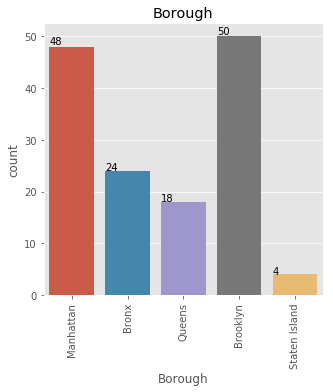

In [54]:
fig,ax = plt.subplots(1, 1, figsize=(5, 5))
sns.countplot(x='Borough',data=FM_NYC_filtered)
ax.set_title("Borough")
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate('', (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))
        ax.set_xticklabels([t.get_text().split("T")[0] for t in ax.get_xticklabels()])

# This sets the yticks "upright" with 0, as opposed to sideways with 90.
plt.xticks(rotation=90) 
plt.show()

In [55]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [56]:
# create map of New York City using latitude and longitude values
map_markets = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, FacilityName, borough in zip(FM_NYC_filtered['Latitude'], FM_NYC_filtered['Longitude'], FM_NYC_filtered['FacilityName'], FM_NYC_filtered['Borough']):
            label = '{}, {}'.format(FacilityName, borough)
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker(
                [lat, lng],
                radius=5,
                popup=label,
                color='green',
                fill=True,
                fill_color='green',
                fill_opacity=0.7,
                parse_html = False).add_to(map_markets)  

map_markets

# Segmenting and Clustering Neighborhoods - Queens and Manhattan

In [57]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


**Load data**

In [59]:
NYC_Geo=pd.read_csv('BON1_NYC_GEO.csv')
print('Data downloaded!')
NYC_Geo.head()
NYC_Geo['Borough'].value_counts().to_frame()
print(NYC_Geo.Borough.unique())

Data downloaded!
['Bronx' 'Manhattan' 'Brooklyn' 'Queens' 'Staten Island']


**Segmenting and Clustering Neighborhoods - Queens and Manhattan**

In [61]:
QM_Geo = NYC_Geo.loc[(NYC_Geo['Borough'] == 'Queens')|(NYC_Geo['Borough'] == 'Manhattan')]
QM_Geo = QM_Geo.reset_index(drop=True)
QM_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Manhattan,Chinatown,40.715618,-73.994279
2,Manhattan,Washington Heights,40.851903,-73.936900
3,Manhattan,Inwood,40.867684,-73.921210
4,Manhattan,Hamilton Heights,40.823604,-73.949688


In [62]:
import time
start_time = time.time()

address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

print("--- %s seconds ---" % round((time.time() - start_time), 2))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.
--- 0.55 seconds ---


In [63]:
# create map of Toronto using latitude and longitude values
map_QM = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(QM_Geo['Latitude'], QM_Geo['Longitude'], QM_Geo['Borough'], QM_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_QM)  
    
map_QM

**Define Foursquare Credentials and Version**

In [64]:
CLIENT_ID = 'OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL' # your Foursquare ID
CLIENT_SECRET = 'VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T' # your Foursquare Secret
VERSION = '20181218' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL
CLIENT_SECRET:VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T


**extract neighboors in Queens and Mahattan**

In [65]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [66]:
QM_venues = getNearbyVenues(names=QM_Geo['Neighborhood'],
                                  latitudes=QM_Geo['Latitude'],
                                  longitudes=QM_Geo['Longitude'],
                                  LIMIT=200)

print('The "QM_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(QM_venues['Venue Category']),
      len(QM_venues['Venue Category'].unique())))

QM_venues.to_csv('QM_venues.csv', sep=',', encoding='UTF8')
QM_venues.head()

Marble Hill
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho
West Village
Manhattan Valley
Morningside Heights
Gramercy
Battery Park City
Financial District
Astoria
Woodside
Jackson Heights
Elmhurst
Howard Beach
Corona
Forest Hills
Kew Gardens
Richmond Hill
Flushing
Long Island City
Sunnyside
East Elmhurst
Maspeth
Ridgewood
Glendale
Rego Park
Woodhaven
Ozone Park
South Ozone Park
College Point
Whitestone
Bayside
Auburndale
Little Neck
Douglaston
Glen Oaks
Bellerose
Kew Gardens Hills
Fresh Meadows
Briarwood
Jamaica Center
Oakland Gardens
Queens Village
Hollis
South Jamaica
St. Albans
Rochdale
Springfield Gardens
Cambria Heights
Rosedale
Far Rockaway
Broad Channel
Breezy Point
Steinway
Beechhurst
Bay Terrace
Edgemere
Arverne
Rockaway Beach
Neponsit
Mur

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
1,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [67]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
QM_venues = pd.read_csv('QM_venues.csv', skiprows=1, names=colnames)
QM_venues.columns = QM_venues.columns.str.replace(' ', '')
QM_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
1,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


**Visualization**

In [68]:
def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) #'Brooklyn, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10)

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [69]:
Venues_Map('New York City, NY', QM_venues)

The geographical coordinates of "New York City, NY" are 40.7127281, -74.0060152.
The "New York City, NY" dataframe has 417 different venue types and 120 neighborhoods.


In [72]:
QM_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)

VenueCategory
Pizza Place                                 347
Coffee Shop                                 260
Italian Restaurant                          233
Bakery                                      229
Chinese Restaurant                          196
Deli / Bodega                               189
Park                                        186
Bar                                         168
Café                                        157
American Restaurant                         153
Ice Cream Shop                              148
Sandwich Place                              148
Donut Shop                                  145
Mexican Restaurant                          143
Gym                                         135
Gym / Fitness Center                        134
Grocery Store                               132
Pharmacy                                    124
Hotel                                       117
Bank                                        111
Sushi Restaurant          

In [73]:
QM_venues.groupby('Neighborhood').count()

,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Arverne,37,37,37,37,37,37
Astoria,100,100,100,100,100,100
Astoria Heights,78,78,78,78,78,78
Auburndale,100,100,100,100,100,100
Battery Park City,100,100,100,100,100,100
Bay Terrace,68,68,68,68,68,68
Bayside,100,100,100,100,100,100
Bayswater,8,8,8,8,8,8
Beechhurst,56,56,56,56,56,56


In [74]:
print('There are {} uniques categories.'.format(len(QM_venues['VenueCategory'].unique())))

There are 417 uniques categories.


**Analyze neighboors**

In [75]:
# one hot encoding
QM_onehot = pd.get_dummies(QM_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(QM_onehot.columns)

# add neighborhood column back to dataframe
QM_onehot['Neighborhood'] = QM_venues['Neighborhood'] 

# move neighborhood column to the first column
QM_onehot = QM_onehot[column_names]

QM_onehot.head()

,Neighborhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Caucasian Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Cafeteria,College Gym,College Residence Hall,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern Greek Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Neighborhood,New American Restaurant,Newsstand,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Paki

In [76]:
restaurant_List = []
search = 'Restaurant'
for i in QM_onehot.columns :
    if search in i:
        restaurant_List.append(i)

In [77]:
restaurant_List

['Afghan Restaurant',
 'African Restaurant',
 'American Restaurant',
 'Arepa Restaurant',
 'Argentinian Restaurant',
 'Asian Restaurant',
 'Australian Restaurant',
 'Austrian Restaurant',
 'Brazilian Restaurant',
 'Cajun / Creole Restaurant',
 'Cambodian Restaurant',
 'Cantonese Restaurant',
 'Caribbean Restaurant',
 'Caucasian Restaurant',
 'Chinese Restaurant',
 'Colombian Restaurant',
 'Comfort Food Restaurant',
 'Cuban Restaurant',
 'Czech Restaurant',
 'Dim Sum Restaurant',
 'Dumpling Restaurant',
 'Eastern European Restaurant',
 'Egyptian Restaurant',
 'Empanada Restaurant',
 'English Restaurant',
 'Ethiopian Restaurant',
 'Falafel Restaurant',
 'Fast Food Restaurant',
 'Filipino Restaurant',
 'French Restaurant',
 'German Restaurant',
 'Gluten-free Restaurant',
 'Greek Restaurant',
 'Halal Restaurant',
 'Hawaiian Restaurant',
 'Himalayan Restaurant',
 'Hotpot Restaurant',
 'Indian Restaurant',
 'Indonesian Restaurant',
 'Israeli Restaurant',
 'Italian Restaurant',
 'Japanese Cur

In [78]:
col_name = []
col_name = ['Neighborhood'] + restaurant_List
QM_restaurant = QM_onehot[col_name]
QM_restaurant = QM_restaurant.iloc[:,1::]

In [79]:
QM_restaurant_grouped = QM_restaurant.groupby('Neighborhood').sum().reset_index()

In [80]:
QM_restaurant_grouped['Total'] = QM_restaurant_grouped .sum(axis=1)

**Clustering**

In [81]:
QM_grouped_clustering = QM_restaurant_grouped.drop('Neighborhood', 1)

for n_cluster in range(2, 10):
    kmeans = KMeans(n_clusters=n_cluster).fit(QM_grouped_clustering)
    label = kmeans.labels_
    sil_coeff = silhouette_score(QM_grouped_clustering, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.46304731792043985
For n_clusters=3, The Silhouette Coefficient is 0.47072827708575693
For n_clusters=4, The Silhouette Coefficient is 0.3690149242157238
For n_clusters=5, The Silhouette Coefficient is 0.3734158182535759
For n_clusters=6, The Silhouette Coefficient is 0.3100164237399326
For n_clusters=7, The Silhouette Coefficient is 0.31237008136787714
For n_clusters=8, The Silhouette Coefficient is 0.22201169537578677
For n_clusters=9, The Silhouette Coefficient is 0.2562977809448113


In [82]:
# set number of clusters
kclusters = 2

QM_grouped_clustering = QM_restaurant_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(QM_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 0, 0], dtype=int32)

In [85]:
QM_results = pd.DataFrame(kmeans.cluster_centers_)
QM_results.columns = QM_grouped_clustering.columns
QM_results.index = ['cluster0','cluster1']
QM_results['Total Sum'] = QM_results.sum(axis = 1)
QM_results

,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Cambodian Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Colombian Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Himalayan Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern Greek Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,Pakistani Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Portuguese Restaurant,Ramen Restaurant,Restaurant,Romanian Restaurant,Russian Restaurant,Salvadoran Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shanghai Restaurant,Soba Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sri Lankan Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Total,Total Sum
cluster0,0.018182,9.090909e-02,2.000000,0.145455,0.218182,0.818182,1.818182e-01,0.036364,0.200000,1.454545e-01,5.454545e-02,0.127273,0.381818,-1.040834e-17,1.854545,0.072727,0.072727,0.363636,5.454545e-02,0.018182,0.181818,0.072727,1.818182e-02,0.127273,3.636364e-02,1.454545e-01,0.127273,0.490909,2.181818e-01,1.000000,0.072727,-1.040834e-17,0.890909,0.054545,7.272727e-02,1.090909e-01,1.090909e-01,1.327273,7.272727e-02,3.636364e-02,2.909091,0.072727,1.327273,5.454545e-02,0.018182,1.709091,0.054545,1.254545,5.454545e-02,0.054545,0.672727,2.090909,0.381818,1.818182e-02,3.636364e-02,9.090909e-02,0.563636,-2.081668e-17,5.454545e-02,0.400000,1.818182e-02,-1.040834e-17,0.363636,0.563636,-1.040834e-17,3.636364e-02,5.454545e-02,1.818182e-02,1.109091,0.218182,5.454545e-02,0.436364,0.418182,0.581818,5.454545e-02,1.618182,1.818182e-02,1.454545e-01,0.018182,0.236364,-1.040834e-17,1.327273,1.090909e-01,1.818182e-01,5.454545e-02,1.818182e-02,0.636364,3.636364e-02,0.472727,32.636364,65.272727
cluster1,0.030769,1.387779e-17,0.661538,0.030769,0.061538,0.353846,2.775558e-17,0.015385,0.061538,-6.938894e-17,2.775558e-17,0.030769,0.661538,1.538462e-02,1.446154,0.030769,0.015385,0.030769,2.775558e-17,0.030769,0.061538,0.076923,-8.673617e-18,0.015385,-1.734723e-17,-6.938894e-17,0.061538,0.784615,1.110223e-16,0.169231,0.046154,1.538462e-02,0.153846,0.046154,-3.469447e-17,5.551115e-17,5.551115e-17,0.569231,-3.469447e-17,-1.734723e-17,1.123077,0.046154,0.461538,2.775558e-17,0.015385,0.138462,0.015385,0.415385,2.775558e-17,0.030769,0.153846,0.430769,0.123077,-8.673617e-18,-1.734723e-17,1.387779e-17,0.076923,3.076923e-02,2.775558e-17,0.123077,-8.673617e-18,1.538462e-02,0.015385,0.384615,1.538462e-02,-1.734723e-17,2.775558e-17,-8.673617e-18,0.307692,0.015385,2.775558e-17,0.184615,0.107692,0.153846,2.775558e-17,0.323077,-8.673617e-18,-6.938894e-17,0.015385,0.076923,1.538462e-02,0.276923,5.551115e-17,2.775558e-17,2.775558e-17,-8.673617e-18,0.107692,-1.734723e-17,0.061538,10.738462,21.476923


In [86]:
QM_results_merged = pd.DataFrame(QM_restaurant_grouped['Neighborhood'])

QM_results_merged['Total'] = QM_restaurant_grouped['Total']
QM_results_merged = QM_results_merged.assign(Cluster_Labels = kmeans.labels_)

In [87]:
print(QM_results_merged.shape)
QM_results_merged

(120, 3)


,Neighborhood,Total,Cluster_Labels
0,Arverne,4,1
1,Astoria,29,0
2,Astoria Heights,8,1
3,Auburndale,34,0
4,Battery Park City,7,1
5,Bay Terrace,9,1
6,Bayside,31,0
7,Bayswater,1,1
8,Beechhurst,10,1
9,Bellaire,11,1


In [88]:
QM_merged = QM_Geo

QM_merged = QM_merged.join(QM_results_merged.set_index('Neighborhood'), on='Neighborhood')

print(QM_merged.shape)
QM_merged.head(10) # check the last columns!

(121, 6)


,Borough,Neighborhood,Latitude,Longitude,Total,Cluster_Labels
0,Manhattan,Marble Hill,40.876551,-73.910660,13,1
1,Manhattan,Chinatown,40.715618,-73.994279,28,0
2,Manhattan,Washington Heights,40.851903,-73.936900,35,0
3,Manhattan,Inwood,40.867684,-73.921210,30,0
4,Manhattan,Hamilton Heights,40.823604,-73.949688,33,0
5,Manhattan,Manhattanville,40.816934,-73.957385,34,0
6,Manhattan,Central Harlem,40.815976,-73.943211,35,0
7,Manhattan,East Harlem,40.792249,-73.944182,29,0
8,Manhattan,Upper East Side,40.775639,-73.960508,26,0
9,Manhattan,Yorkville,40.775930,-73.947118,31,0


**Visualization of clusters**

In [89]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(QM_merged['Latitude'], QM_merged['Longitude'], QM_merged['Neighborhood'], QM_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters